# Step 1: Investigating the dataset

In [1375]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

data download linK:   https://www.udacity.com/api/nodes/5430778793/supplemental_media/daily-engagement-fullcsv/download

In [1701]:
data = pd.read_csv('daily_engagement_full.csv')

In [1703]:
data.head()

,utc_date,acct,registration_date,subscription_start,course_key,sibling_key,course_title,has_visited,total_minutes_visited,lessons_completed,projects_completed,account_key
0,2014-11-05,448,2014-08-05,2014-11-05,ud359-nd,ud359,Intro to Data Science,0.0,0.0,0.0,0.0,2257038596
1,2014-11-05,448,2014-08-05,2014-11-05,ud120-nd,ud120,Intro to Machine Learning,0.0,0.0,0.0,0.0,2257038596
2,2014-11-05,448,2014-08-05,2014-11-05,ud651-nd,ud651,Data Analysis with R,0.0,0.0,0.0,0.0,2257038596
3,2014-11-05,448,2014-08-05,2014-11-05,ud507-nd,ud507,Data Visualization and D3.js,0.0,0.0,0.0,0.0,2257038596
4,2014-11-05,448,2014-08-05,2014-11-05,ud651,ud651,Data Analysis with R,0.0,0.0,0.0,0.0,2257038596


In [1378]:
data.columns

Index(['utc_date', 'acct', 'registration_date', 'subscription_start',
       'course_key', 'sibling_key', 'course_title', 'has_visited',
       'total_minutes_visited', 'lessons_completed', 'projects_completed',
       'account_key'],
      dtype='object')

In [1379]:
print('Shape of the Dataframe:',data.shape,'\n')

Shape of the Dataframe: (2309239, 12) 



In [1380]:
data.dtypes

utc_date                  object
acct                       int64
registration_date         object
subscription_start        object
course_key                object
sibling_key               object
course_title              object
has_visited              float64
total_minutes_visited    float64
lessons_completed        float64
projects_completed       float64
account_key               object
dtype: object

In [1382]:
%%time
start='\033[1m'
end='\033[0;0m'

Wall time: 0 ns


In [1383]:
all_null = data.isnull().sum().sum()
not_null = data.notnull().sum().sum()
print(f"{start}Null values number for all table is {all_null}, while not null values count is {not_null}{end}") 

Null values number for all table is 0, while not null values count is 27710868


In [1384]:
data.isnull().sum()

utc_date                 0
acct                     0
registration_date        0
subscription_start       0
course_key               0
sibling_key              0
course_title             0
has_visited              0
total_minutes_visited    0
lessons_completed        0
projects_completed       0
account_key              0
dtype: int64

In [1385]:
print(f'{start}Summary Of the dataframe:{end}','\n')
print(data.info(),'\n')

Summary Of the dataframe: 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2309239 entries, 0 to 2309238
Data columns (total 12 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   utc_date               object 
 1   acct                   int64  
 2   registration_date      object 
 3   subscription_start     object 
 4   course_key             object 
 5   sibling_key            object 
 6   course_title           object 
 7   has_visited            float64
 8   total_minutes_visited  float64
 9   lessons_completed      float64
 10  projects_completed     float64
 11  account_key            object 
dtypes: float64(4), int64(1), object(7)
memory usage: 211.4+ MB
None 



In [1387]:
print(f'{start}Describtion Of the dataframe:{end}','\n')
data.describe()

Describtion Of the dataframe: 



,acct,has_visited,total_minutes_visited,lessons_completed,projects_completed
count,2.309239e+06,2.309239e+06,2.309239e+06,2.309239e+06,2.309239e+06
mean,4.496441e+02,2.012178e-02,1.448495e+00,7.598607e-03,3.971005e-04
std,3.215611e+02,1.404169e-01,1.525523e+01,1.128178e-01,1.992343e-02
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.010000e+02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,3.940000e+02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
75%,5.960000e+02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
max,1.305000e+03,1.000000e+00,7.371061e+02,1.600000e+01,1.000000e+00


In [1412]:
describ_cols = data.describe().columns

In [1433]:
describ_cols

Index(['acct', 'has_visited', 'total_minutes_visited', 'lessons_completed',
       'projects_completed'],
      dtype='object')

In [1391]:
data_describtion = data.describe().transpose()

In [1392]:
data_describtion

,count,mean,std,min,25%,50%,75%,max
acct,2309239.0,449.644054,321.561123,0.0,201.0,394.0,596.0,1305.000000
has_visited,2309239.0,0.020122,0.140417,0.0,0.0,0.0,0.0,1.000000
total_minutes_visited,2309239.0,1.448495,15.255230,0.0,0.0,0.0,0.0,737.106143
lessons_completed,2309239.0,0.007599,0.112818,0.0,0.0,0.0,0.0,16.000000
projects_completed,2309239.0,0.000397,0.019923,0.0,0.0,0.0,0.0,1.000000


In [1411]:
data_describtion.columns

Index(['count', 'mean', 'std', 'min', '25%', '50%', '75%', 'max'], dtype='object')

In [1421]:
data_describtion.dtypes

count    float64
mean     float64
std      float64
min      float64
25%      float64
50%      float64
75%      float64
max      float64
dtype: object

In [1434]:
def data_skewness(df, mean, median, lst_of_cols):
    for i, m in (enumerate(df[mean])):
        for j, med in (enumerate(df[median])):
            if i == j:
                if int(m) > int(med):
                    print('Mean > Median')
                    print(f'{lst_of_cols[i]}: rightly skewed\n\n')
                
                elif int(m) < int(med):
                    print('Mean < Median')
                    print(f'{lst_of_cols[i]}: leftly skewed\n\n')
                
                elif int(m) == int(med):
                    print('Mean ~ Median')
                    print(f'{lst_of_cols[i]}: almost Normal Distributed\n\n')

In [1435]:
data_skewness(data_describtion, 'mean', '50%', describ_cols)

Mean > Median
acct: rightly skewed


Mean ~ Median
has_visited: almost Normal Distributed


Mean > Median
total_minutes_visited: rightly skewed


Mean ~ Median
lessons_completed: almost Normal Distributed


Mean ~ Median
projects_completed: almost Normal Distributed




In [1702]:
def box_plots(df, cols_lst):
    # boxplot all the numerical columns and see if there any outliers
    for i in cols_lst:
        df.iloc[:, 1:].boxplot(column=i)
        plt.title(f"Box Plot Of {i}" , fontsize=20, color="orange")
        plt.savefig(f'{i}.png', facecolor='w', bbox_inches="tight", pad_inches=0.3, transparent=False)
        plt.show()

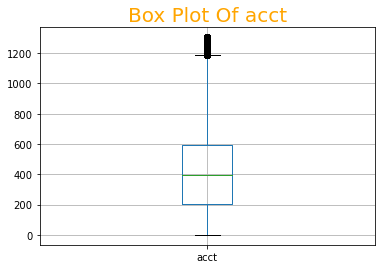

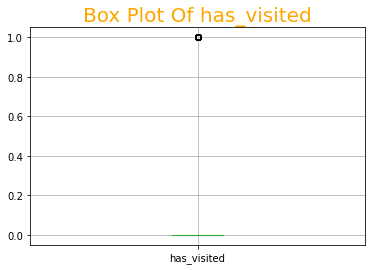

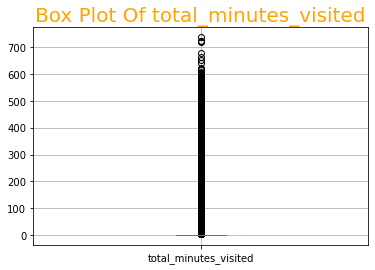

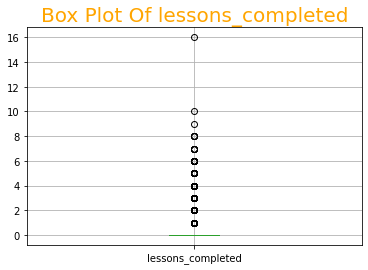

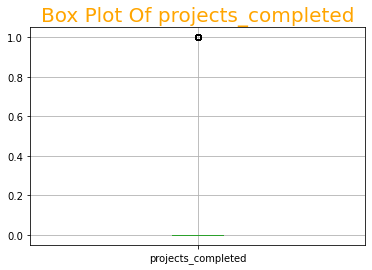

In [1704]:
box_plots(data, describ_cols)

In [1709]:
def count_plot(df, cols_lst):
    for i in cols_lst:
        plt.figure(figsize=(12,6))
        plt.xticks(rotation = 45)
        plt.title(f"Analysis of {i}" , fontsize=20, color="orange")
        plt.savefig(f'Analysis of {i}.png', facecolor='w', bbox_inches="tight", pad_inches=0.3, transparent=False)
        sns.countplot(df[i], color='green')
        plt.show()

D:\Programs\Anaconda2\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


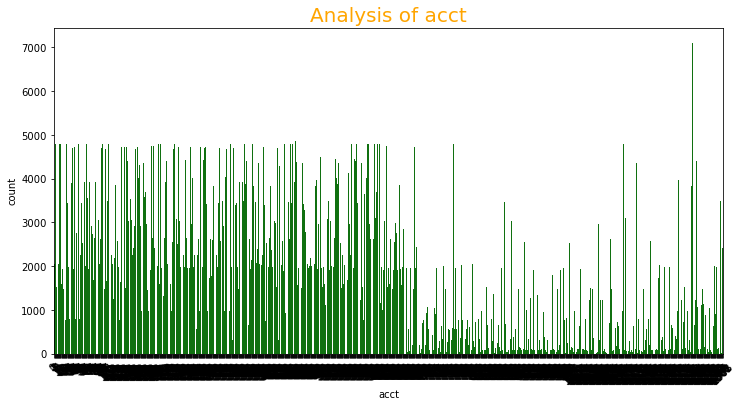

D:\Programs\Anaconda2\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


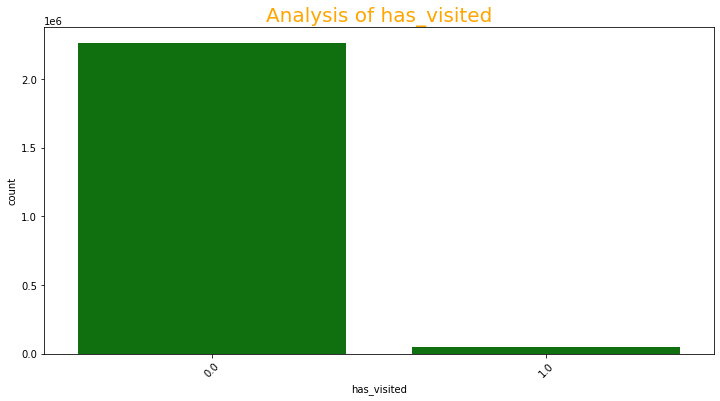

D:\Programs\Anaconda2\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


KeyboardInterrupt: 

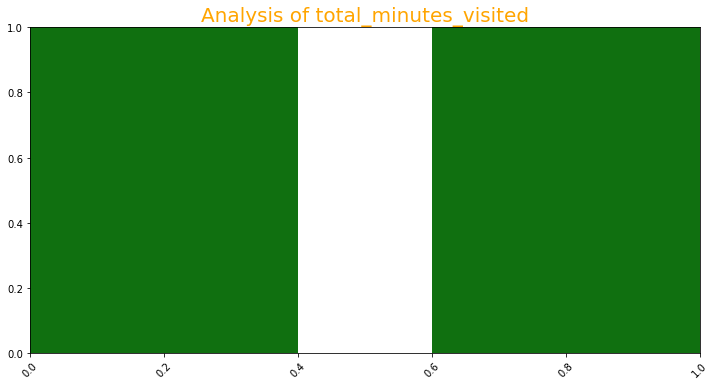

In [1710]:
count_plot(data, describ_cols)

In [106]:
print(data['acct'].unique())
print(len(data['acct'].unique()))

[448  44 258 ... 874 754 854]
1237


In [107]:
print(data['account_key'].unique())
print(len(data['account_key'].unique()))

['2257038596' '59503937' '1603920644' ... '4804719296' '3567109205'
 'u26334020']
1237


In [108]:
print(f"The number of students: {len(data['account_key'].unique())}")

The number of students: 1237


In [109]:
for col in data.columns:
    #print(f'unique_vals: {data[col].unique()}')
    print(f'column_name: {col}, \n\tnum_of_unique_vals: {len(data[col].unique())}, \n{data[col].value_counts()}', end='\n\n')

column_name: utc_date, 
	num_of_unique_vals: 295, 
2015-07-10    22860
2015-07-11    22752
2015-07-09    22716
2015-08-23    12369
2015-08-25    12274
              ...  
2014-11-08       15
2014-11-07       15
2014-11-06       15
2014-11-09       15
2014-11-05       15
Name: utc_date, Length: 295, dtype: int64

column_name: acct, 
	num_of_unique_vals: 1237, 
1244    7098
442     6518
448     4858
604     4783
568     4783
        ... 
1301      15
1043      15
890       15
908       15
1047      15
Name: acct, Length: 1237, dtype: int64

column_name: registration_date, 
	num_of_unique_vals: 687, 
2014-11-13    66784
2014-12-05    53848
2014-10-07    50461
2014-11-12    36944
2014-11-10    30960
              ...  
2014-10-25       18
2014-12-30       17
2014-06-23       15
2012-02-01       15
2012-02-21       15
Name: registration_date, Length: 687, dtype: int64

column_name: subscription_start, 
	num_of_unique_vals: 115, 
2014-11-10    302388
2015-03-10    147346
2014-11-14     81253

In [110]:
dict_col1 = dict(data['acct'].value_counts())

In [111]:
len(dict_col1)

1237

In [112]:
data1 = pd.DataFrame.from_dict(dict_col1, orient='index').T
data1

,1244,442,448,604,568,3,198,223,140,195,...,1083,838,994,683,925,1301,1043,890,908,1047
0,7098,6518,4858,4783,4783,4783,4783,4783,4783,4783,...,15,15,15,15,15,15,15,15,15,15


In [1436]:
def plotData_subplot(df, sub_title, col1, col2):
    fig, axes = plt.subplots(1, 2, figsize=(11, 6))
    fig.suptitle(sub_title, fontsize=16)
    
    dict_col1 = dict(df[col1].value_counts())
    dict_col2 = dict(df[col2].value_counts())
    
    data1 = pd.DataFrame.from_dict(dict_col1, orient='index').T
    data2 = pd.DataFrame.from_dict(dict_col2, orient='index').T
    
    data1.plot(kind='bar', ax=axes[0])
    data2.plot(kind='bar', ax=axes[1])
    
    axes[0].set_title(col1)
    axes[1].set_title(col2)
    plt.show()

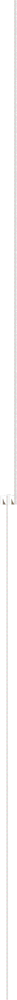

In [1437]:
plotData_subplot(data, 'acct vs account_key','acct', 'account_key')

In [1438]:
def plotData(df, col):
    dict_col = dict(df[col].value_counts())
    data = pd.DataFrame.from_dict(dict_col, orient='index').T
    data.plot(kind='bar')
    
    plt.xlabel(col)
    plt.show()

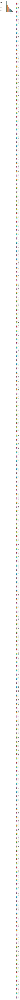

In [1439]:
plotData(data, 'acct')

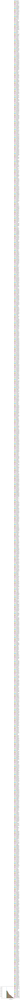

In [1440]:
plotData(data, 'account_key')

#### it seems that both columns 'acct' and 'account_key' represent the same data so let's build a function to check that

In [1441]:
data.duplicated().sum()

34164

In [1442]:
(~data.duplicated()).sum()

2275075

In [1443]:
# Extract duplicate rows
data.loc[data.duplicated(), :]

,utc_date,acct,registration_date,subscription_start,course_key,sibling_key,course_title,has_visited,total_minutes_visited,lessons_completed,projects_completed,account_key
3911,2015-07-09,448,2014-08-05,2015-03-10,ud359-nd,ud359,Intro to Data Science,0.0,0.000000,0.0,0.0,2257038596
3912,2015-07-09,448,2014-08-05,2015-03-10,ud651-nd,ud651,Data Analysis with R,0.0,0.000000,0.0,0.0,2257038596
3913,2015-07-09,448,2014-08-05,2015-03-10,ud032-nd,ud032,Data Wrangling with MongoDB,0.0,0.000000,0.0,0.0,2257038596
3914,2015-07-09,448,2014-08-05,2015-03-10,ud120-nd,ud120,Intro to Machine Learning,0.0,0.000000,0.0,0.0,2257038596
3915,2015-07-09,448,2014-08-05,2015-03-10,ud507-nd,ud507,Data Visualization and D3.js,0.0,0.000000,0.0,0.0,2257038596
...,...,...,...,...,...,...,...,...,...,...,...,...
2260954,2015-07-11,813,2015-06-19,2015-07-11,ud032,ud032,Data Wrangling with MongoDB,0.0,0.000000,0.0,0.0,4495968580
2260955,2015-07-11,813,2015-06-19,2015-07-11,ud507,ud507,Data Visualization and D3.js,0.0,0.000000,0.0,0.0,4495968580
2260956,2015-07-11,813,2015-06-19,2015-07-11,ud304,ud304,Intro to HTML and CSS,0.0,0.000000,0.0,0.0,4495968580
2260957,2015-07-11,813,2015-06-19,2015-07-11,ud651,ud651,Data Analysis with R,0.0,0.000000,0.0,0.0,4495968580


In [1444]:
data.drop_duplicates(inplace=True)

In [1445]:
data.shape

(2275075, 12)

# Step 2: Preprocessing

In [123]:
#def compare_vals(df, col1, col2):
    

In [1446]:
# take two columns and returns true if each colum represent the same relation that the other column represents 
def represent_same(df, col1, col2):
    dict_col1 = dict(df[col1].value_counts())
    dict_col2 = dict(df[col2].value_counts())

    check = [True for i, x in enumerate(dict_col1) for j, y in enumerate(dict_col2) if i==j and dict_col1[x]==dict_col2[y]]

    check = set(check)
    if len(check)==1:
        return True
    return False

In [1447]:
same = represent_same(data, 'acct', 'account_key')

In [1448]:
print(same)

True


###### So we can dispense with one of the two columns: 'acct' and 'account_key', I prefer to drop 'account key' as it has long numbers, and I'll rename 'acct' into 'account_key'

In [1449]:
data.drop('account_key', inplace=True, axis=1)

In [1450]:
data.rename(columns={'acct':'account_key'}, inplace=True)

In [1451]:
data

,utc_date,account_key,registration_date,subscription_start,course_key,sibling_key,course_title,has_visited,total_minutes_visited,lessons_completed,projects_completed
0,2014-11-05,448,2014-08-05,2014-11-05,ud359-nd,ud359,Intro to Data Science,0.0,0.0,0.0,0.0
1,2014-11-05,448,2014-08-05,2014-11-05,ud120-nd,ud120,Intro to Machine Learning,0.0,0.0,0.0,0.0
2,2014-11-05,448,2014-08-05,2014-11-05,ud651-nd,ud651,Data Analysis with R,0.0,0.0,0.0,0.0
3,2014-11-05,448,2014-08-05,2014-11-05,ud507-nd,ud507,Data Visualization and D3.js,0.0,0.0,0.0,0.0
4,2014-11-05,448,2014-08-05,2014-11-05,ud651,ud651,Data Analysis with R,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
2309234,2015-08-26,854,2012-10-12,2015-08-23,ud359,ud359,Intro to Data Science,0.0,0.0,0.0,0.0
2309235,2015-08-26,854,2012-10-12,2015-08-23,ud804,ud804,JavaScript Basics,0.0,0.0,0.0,0.0
2309236,2015-08-26,854,2012-10-12,2015-08-23,ud651,ud651,Data Analysis with R,0.0,0.0,0.0,0.0
2309237,2015-08-26,854,2012-10-12,2015-08-23,ud304,ud304,Intro to HTML and CSS,0.0,0.0,0.0,0.0


In [1452]:
data.dtypes

utc_date                  object
account_key                int64
registration_date         object
subscription_start        object
course_key                object
sibling_key               object
course_title              object
has_visited              float64
total_minutes_visited    float64
lessons_completed        float64
projects_completed       float64
dtype: object

In [1453]:
represent_same(data, 'utc_date', 'registration_date')

False

In [1454]:
represent_same(data, 'utc_date', 'subscription_start')

False

In [1455]:
represent_same(data, 'registration_date', 'subscription_start')

False

In [1456]:
data['utc_date'] = pd.to_datetime(data['utc_date'])
data['registration_date'] = pd.to_datetime(data['registration_date'])
data['subscription_start'] = pd.to_datetime(data['subscription_start'])

In [1457]:
data.dtypes

utc_date                 datetime64[ns]
account_key                       int64
registration_date        datetime64[ns]
subscription_start       datetime64[ns]
course_key                       object
sibling_key                      object
course_title                     object
has_visited                     float64
total_minutes_visited           float64
lessons_completed               float64
projects_completed              float64
dtype: object

In [1458]:
data.dtypes

utc_date                 datetime64[ns]
account_key                       int64
registration_date        datetime64[ns]
subscription_start       datetime64[ns]
course_key                       object
sibling_key                      object
course_title                     object
has_visited                     float64
total_minutes_visited           float64
lessons_completed               float64
projects_completed              float64
dtype: object

In [1459]:
data

,utc_date,account_key,registration_date,subscription_start,course_key,sibling_key,course_title,has_visited,total_minutes_visited,lessons_completed,projects_completed
0,2014-11-05,448,2014-08-05,2014-11-05,ud359-nd,ud359,Intro to Data Science,0.0,0.0,0.0,0.0
1,2014-11-05,448,2014-08-05,2014-11-05,ud120-nd,ud120,Intro to Machine Learning,0.0,0.0,0.0,0.0
2,2014-11-05,448,2014-08-05,2014-11-05,ud651-nd,ud651,Data Analysis with R,0.0,0.0,0.0,0.0
3,2014-11-05,448,2014-08-05,2014-11-05,ud507-nd,ud507,Data Visualization and D3.js,0.0,0.0,0.0,0.0
4,2014-11-05,448,2014-08-05,2014-11-05,ud651,ud651,Data Analysis with R,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
2309234,2015-08-26,854,2012-10-12,2015-08-23,ud359,ud359,Intro to Data Science,0.0,0.0,0.0,0.0
2309235,2015-08-26,854,2012-10-12,2015-08-23,ud804,ud804,JavaScript Basics,0.0,0.0,0.0,0.0
2309236,2015-08-26,854,2012-10-12,2015-08-23,ud651,ud651,Data Analysis with R,0.0,0.0,0.0,0.0
2309237,2015-08-26,854,2012-10-12,2015-08-23,ud304,ud304,Intro to HTML and CSS,0.0,0.0,0.0,0.0


In [1460]:
print(data['course_title'].unique())
print(len(data['course_title'].unique()))

['Intro to Data Science' 'Intro to Machine Learning'
 'Data Analysis with R' 'Data Visualization and D3.js' 'JavaScript Basics'
 'Data Wrangling with MongoDB' 'Intro to HTML and CSS'
 'Data Analyst Nanodegree' 'A/B Testing' 'ud134-nd' 'ud134a-nd']
11


In [1461]:
print(data['sibling_key'].unique())
print(len(data['sibling_key'].unique()))

['ud359' 'ud120' 'ud651' 'ud507' 'ud804' 'ud032' 'ud304' 'nd002' 'ud257'
 'ud134' 'ud134a']
11


In [1462]:
print(data['course_key'].unique())
print(len(data['course_key'].unique()))

['ud359-nd' 'ud120-nd' 'ud651-nd' 'ud507-nd' 'ud651' 'ud804-nd' 'ud032-nd'
 'ud304-nd' 'ud120' 'ud359' 'ud032' 'ud507' 'ud304' 'ud804' 'nd002'
 'ud257-nd' 'ud257' 'ud134-nd' 'ud134a-nd']
19


##### It seems that the same values are common between the 'sibling_key' and  'course_key'

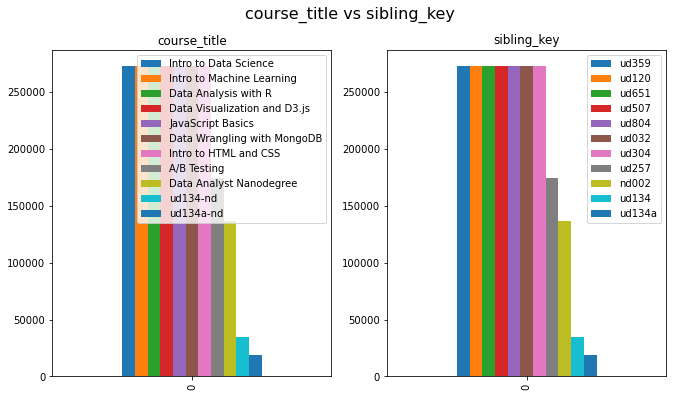

In [1463]:
plotData_subplot(data, 'course_title vs sibling_key','course_title', 'sibling_key')

#### it seems that both columns 'course_title' and 'sibling_key' represent the same data so let's check that using represent_same

In [1464]:
represent_same(data, 'course_title', 'sibling_key')

True

In [1465]:
print(data['course_key'].unique())
print(len(data['course_key'].unique()))

['ud359-nd' 'ud120-nd' 'ud651-nd' 'ud507-nd' 'ud651' 'ud804-nd' 'ud032-nd'
 'ud304-nd' 'ud120' 'ud359' 'ud032' 'ud507' 'ud304' 'ud804' 'nd002'
 'ud257-nd' 'ud257' 'ud134-nd' 'ud134a-nd']
19


In [1466]:
user_course = data.groupby(['account_key', 'course_title'])

In [1467]:
user_course.first()

utc_date registration_date  \
account_key course_title                                                
0           A/B Testing                  2015-03-05        2015-01-09   
            Data Analysis with R         2015-01-09        2015-01-09   
            Data Analyst Nanodegree      2015-01-09        2015-01-09   
            Data Visualization and D3.js 2015-01-09        2015-01-09   
            Data Wrangling with MongoDB  2015-01-09        2015-01-09   
...                                             ...               ...   
1305        Data Wrangling with MongoDB  2015-05-12        2014-10-31   
            Intro to Data Science        2015-05-12        2014-10-31   
            Intro to HTML and CSS        2015-05-12        2014-10-31   
            Intro to Machine Learning    2015-05-12        2014-10-31   
            JavaScript Basics            2015-05-12        2014-10-31   

                                         subscription_start course_key  \
account_key course_title                                                 
0           A/B Testing                          2015-01-09   ud257-nd   
            Data Analysis with R                 2015-01-09   ud651-nd   
            Data Analyst Nanodegree              2015-01-09      nd002   
            Data Visualization and D3.js         2015-01-09   ud507-nd   
            Data Wrangling with MongoDB          2015-01-09      ud032   
...                                                     ...        ...   
1305        Data Wrangling with MongoDB          2015-05-12   ud032-nd   
            Intro to Data Science                2015-05-12   ud359-nd   
            Intro to HTML and CSS                2015-05-12   ud304-nd   
            Intro to Machine Learning            2015-05-12   ud120-nd   
            JavaScript Basics                    2015-05-12   ud804-nd   

                                         sibling_key  has_visited  \
account_key course_title                                            
0           A/B Testing                        ud257          0.0   
            Data Analysis with R               ud651          0.0   
            Data Analyst Nanodegree            nd002          1.0   
            Data Visualization and D3.js       ud507          0.0   
            Data Wrangling with MongoDB        ud032          0.0   
...                                              ...          ...   
1305        Data Wrangling with MongoDB        ud032          0.0   
            Intro to Data Science              ud359          0.0   
            Intro to HTML and CSS              ud304          0.0   
            Intro to Machine Learning          ud120          0.0   
            JavaScript Basics                  ud804          0.0   

                                          total_minutes_visited  \
account_key course_title                                          
0           A/B Testing                                0.000000   
            Data Analysis with R                       0.000000   
            Data Analyst Nanodegree                   11.679374   
            Data Visualization and D3.js               0.000000   
            Data Wrangling with MongoDB                0.000000   
...                                                         ...   
1305        Data Wrangling with MongoDB                0.000000   
            Intro to Data Science                      0.000000   
            Intro to HTML and CSS                      0.000000   
            Intro to Machine Learning                  0.000000   
            JavaScript Basics                          0.000000   

                                          lessons_completed  \
account_key course_title                                      
0           A/B Testing                                 0.0   
            Data Analysis with R                        0.0   
            Data Analyst Nanodegree                     0.0   
            Data Visualization and D3.js     

In [1468]:
course_title_key = data.groupby(['course_title', 'course_key'])

In [1469]:
course_title_key.first()

utc_date  account_key  \
course_title                 course_key                           
A/B Testing                  ud257      2015-03-05          448   
                             ud257-nd   2015-03-05          448   
Data Analysis with R         ud651      2014-11-05          448   
                             ud651-nd   2014-11-05          448   
Data Analyst Nanodegree      nd002      2014-11-05          448   
Data Visualization and D3.js ud507      2014-11-05          448   
                             ud507-nd   2014-11-05          448   
Data Wrangling with MongoDB  ud032      2014-11-05          448   
                             ud032-nd   2014-11-05          448   
Intro to Data Science        ud359      2014-11-05          448   
                             ud359-nd   2014-11-05          448   
Intro to HTML and CSS        ud304      2014-11-05          448   
                             ud304-nd   2014-11-05          448   
Intro to Machine Learning    ud120      2014-11-05          448   
                             ud120-nd   2014-11-05          448   
JavaScript Basics            ud804      2014-11-05          448   
                             ud804-nd   2014-11-05          448   
ud134-nd                     ud134-nd   2015-07-04          448   
ud134a-nd                    ud134a-nd  2015-07-30          448   

                                        registration_date subscription_start  \
course_title                 course_key                                        
A/B Testing                  ud257             2014-08-05         2015-01-27   
                             ud257-nd          2014-08-05         2015-01-27   
Data Analysis with R         ud651             2014-08-05         2014-11-05   
                             ud651-nd          2014-08-05         2014-11-05   
Data Analyst Nanodegree      nd002             2014-08-05         2014-11-05   
Data Visualization and D3.js ud507             2014-08-05         2014-11-05   
                             ud507-nd          2014-08-05         2014-11-05   
Data Wrangling with MongoDB  ud032             2014-08-05         2014-11-05   
                             ud032-nd          2014-08-05         2014-11-05   
Intro to Data Science        ud359             2014-08-05         2014-11-05   
                             ud359-nd          2014-08-05         2014-11-05   
Intro to HTML and CSS        ud304             2014-08-05         2014-11-05   
                             ud304-nd          2014-08-05         2014-11-05   
Intro to Machine Learning    ud120             2014-08-05         2014-11-05   
                             ud120-nd          2014-08-05         2014-11-05   
JavaScript Basics            ud804             2014-08-05         2014-11-05   
                             ud804-nd          2014-08-05         2014-11-05   
ud134-nd                     ud134-nd          2014-08-05         2015-03-10   
ud134a-nd                    ud134a-nd         2014-08-05         2015-03-10   

                                        sibling_key  has_visited  \
course_title                 course_key                            
A/B Testing                  ud257            ud257          0.0   
                             ud257-nd         ud257          0.0   
Data Analysis with R         ud651            ud651          0.0   
                             ud651-nd         ud651          0.0   
Data Analyst Nanodegree      nd002            nd002          0.0   
Data Visualization and D3.js ud507            ud507          0.0   
                             ud507-nd         ud507          0.0   
Data Wrangling with MongoDB  ud032            ud032          0.0   
                             ud032-nd         ud032          0.0   
Intro to Data Science        ud359            ud359          0.0   
                             ud359-nd         ud359          0.0   
Intro to HTML and CSS        ud304            ud304          0.0   
 

#### it seems that there's more than one 'course_key' for each  'course_title', so let's ensure this with a function

In [1470]:
def course_key_dict(df, col1, col2):
    col1_col2 = {}   
    for course in df[col1].unique():
        values = []
        for ck in df[col2][df[col1]==course]:
            values.append(ck)
        col1_col2[course] = set(values)
    
    print(col1_col2)
    print(len(col1_col2))
    return col1_col2

In [1471]:
course_title_key = course_key_dict(data, 'course_title', 'course_key')

{'Intro to Data Science': {'ud359-nd', 'ud359'}, 'Intro to Machine Learning': {'ud120', 'ud120-nd'}, 'Data Analysis with R': {'ud651', 'ud651-nd'}, 'Data Visualization and D3.js': {'ud507', 'ud507-nd'}, 'JavaScript Basics': {'ud804', 'ud804-nd'}, 'Data Wrangling with MongoDB': {'ud032-nd', 'ud032'}, 'Intro to HTML and CSS': {'ud304-nd', 'ud304'}, 'Data Analyst Nanodegree': {'nd002'}, 'A/B Testing': {'ud257-nd', 'ud257'}, 'ud134-nd': {'ud134-nd'}, 'ud134a-nd': {'ud134a-nd'}}
11


In [1472]:
course_title_sibling = course_key_dict(data, 'course_title', 'sibling_key')

{'Intro to Data Science': {'ud359'}, 'Intro to Machine Learning': {'ud120'}, 'Data Analysis with R': {'ud651'}, 'Data Visualization and D3.js': {'ud507'}, 'JavaScript Basics': {'ud804'}, 'Data Wrangling with MongoDB': {'ud032'}, 'Intro to HTML and CSS': {'ud304'}, 'Data Analyst Nanodegree': {'nd002'}, 'A/B Testing': {'ud257'}, 'ud134-nd': {'ud134'}, 'ud134a-nd': {'ud134a'}}
11


##### So we can dispense with both: 'course_key' and 'sibling_key', as both just refer to the course title and gives no more needed details

In [1473]:
data.drop('sibling_key', inplace=True, axis=1)
data.drop('course_key', inplace=True, axis=1)

In [1474]:
data

,utc_date,account_key,registration_date,subscription_start,course_title,has_visited,total_minutes_visited,lessons_completed,projects_completed
0,2014-11-05,448,2014-08-05,2014-11-05,Intro to Data Science,0.0,0.0,0.0,0.0
1,2014-11-05,448,2014-08-05,2014-11-05,Intro to Machine Learning,0.0,0.0,0.0,0.0
2,2014-11-05,448,2014-08-05,2014-11-05,Data Analysis with R,0.0,0.0,0.0,0.0
3,2014-11-05,448,2014-08-05,2014-11-05,Data Visualization and D3.js,0.0,0.0,0.0,0.0
4,2014-11-05,448,2014-08-05,2014-11-05,Data Analysis with R,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
2309234,2015-08-26,854,2012-10-12,2015-08-23,Intro to Data Science,0.0,0.0,0.0,0.0
2309235,2015-08-26,854,2012-10-12,2015-08-23,JavaScript Basics,0.0,0.0,0.0,0.0
2309236,2015-08-26,854,2012-10-12,2015-08-23,Data Analysis with R,0.0,0.0,0.0,0.0
2309237,2015-08-26,854,2012-10-12,2015-08-23,Intro to HTML and CSS,0.0,0.0,0.0,0.0


In [1475]:
#plotData_subplot(data, 'course_title vs course_key', 'course_title', 'course_key')

#### it seems that both columns 'course_title' and 'course_key' represent the same data so let's check that

In [1476]:
#course_key_dict(data, 'account_key', 'course_title')

In [1477]:
def stats(df, col1, col2, threshold, title):
    counter = {}   
    total = 0
    for c_key in df[col1].unique():
        cnt=0
        for v in df[col2][df[col1]==c_key]:
            if v>=threshold:
                cnt+=1
        total+=cnt
        counter[c_key] = cnt
    
    #print(counter)
    print(len(counter))
    print(f"{title}: {total}")
    return counter

In [1478]:
visited_dict = stats(data, 'course_title', 'has_visited', 1, "Total number of visits for all courses")

11
Total number of visits for all courses: 45865


In [1486]:
visited_dict

{'Intro to Data Science': 13958,
 'Intro to Machine Learning': 4699,
 'Data Analysis with R': 5355,
 'Data Visualization and D3.js': 1584,
 'JavaScript Basics': 232,
 'Data Wrangling with MongoDB': 11073,
 'Intro to HTML and CSS': 348,
 'Data Analyst Nanodegree': 7507,
 'A/B Testing': 354,
 'ud134-nd': 716,
 'ud134a-nd': 39}

In [1487]:
minutes_dict = stats(data, 'course_title', 'total_minutes_visited', 1, "Total number of visits for all courses")

11
Total number of visits for all courses: 45865


In [1488]:
minutes_dict

{'Intro to Data Science': 13958,
 'Intro to Machine Learning': 4699,
 'Data Analysis with R': 5355,
 'Data Visualization and D3.js': 1584,
 'JavaScript Basics': 232,
 'Data Wrangling with MongoDB': 11073,
 'Intro to HTML and CSS': 348,
 'Data Analyst Nanodegree': 7507,
 'A/B Testing': 354,
 'ud134-nd': 716,
 'ud134a-nd': 39}

In [1489]:
visited_dict == minutes_dict

True

#### Actually 'total_minutes_visited' column represents also the 'has_visited' column, so we can remove the 'has_visited' column

In [1491]:
data.drop('has_visited', inplace=True, axis=1)

In [1492]:
data

,utc_date,account_key,registration_date,subscription_start,course_title,total_minutes_visited,lessons_completed,projects_completed
0,2014-11-05,448,2014-08-05,2014-11-05,Intro to Data Science,0.0,0.0,0.0
1,2014-11-05,448,2014-08-05,2014-11-05,Intro to Machine Learning,0.0,0.0,0.0
2,2014-11-05,448,2014-08-05,2014-11-05,Data Analysis with R,0.0,0.0,0.0
3,2014-11-05,448,2014-08-05,2014-11-05,Data Visualization and D3.js,0.0,0.0,0.0
4,2014-11-05,448,2014-08-05,2014-11-05,Data Analysis with R,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...
2309234,2015-08-26,854,2012-10-12,2015-08-23,Intro to Data Science,0.0,0.0,0.0
2309235,2015-08-26,854,2012-10-12,2015-08-23,JavaScript Basics,0.0,0.0,0.0
2309236,2015-08-26,854,2012-10-12,2015-08-23,Data Analysis with R,0.0,0.0,0.0
2309237,2015-08-26,854,2012-10-12,2015-08-23,Intro to HTML and CSS,0.0,0.0,0.0


In [1498]:
def stats_study(df, col1, col2, title):
    counter = {}   
    total = 0
    for c_key in df[col1].unique():
        cnt=0
        for v in df[col2][df[col1]==c_key]:
            cnt+=v/60
        total+=cnt
        counter[c_key] = cnt
    
    print(len(counter))
    print(f"{title}: {total} hour")
    return counter

In [1499]:
total_study_minutes_per_user = stats_study(data, 'account_key', 'total_minutes_visited', "Total study hour per each student")

1237
Total study hour per each student: 55024.38935129667 hour


In [1500]:
total_study_minutes_per_user

{448: 21.173192013890336,
 44: 71.18038214720835,
 258: 99.50050039167105,
 366: 105.81184049721902,
 587: 62.6561287222055,
 943: 0.26470904722166666,
 412: 123.48049746669066,
 837: 0.0,
 1288: 2.869097194443334,
 1006: 1.8403854222233333,
 429: 48.88846973608816,
 130: 96.78687172223566,
 31: 57.22401807498382,
 919: 100.70693086666853,
 204: 181.77559803617393,
 439: 170.21245273887598,
 72: 65.00673827497684,
 580: 110.54249786947767,
 225: 105.71674153332118,
 179: 90.19885272778366,
 224: 118.02267986666554,
 553: 159.76570674169494,
 1094: 10.678149669457332,
 649: 66.80892004999664,
 655: 21.992219833343334,
 336: 163.6031518861051,
 150: 135.11573245555178,
 408: 33.88229169167434,
 458: 28.562698436086496,
 494: 104.13453096943348,
 369: 264.70542058060903,
 913: 3.332299638888333,
 601: 17.362784130564997,
 506: 165.52130688055496,
 156: 70.48307957779967,
 963: 0.6913395083333334,
 522: 74.48242225275705,
 595: 106.83973580555318,
 480: 43.645340455553175,
 544: 99.2032230

In [1511]:
def plotDict(dictionary, num, xl, yl, title):
    sorted_dict = dict(sorted(dictionary.items(), key=lambda x:x[1]))
    df = pd.DataFrame.from_dict(sorted_dict, orient='index')
    pd_toPlot = pd.concat([df.head(num), df.tail(num)])
    
    #return pd_toPlot
    #pd_toPlot.plot(kind='bar', title=title, figsize=(12, 6))
    #c = ['red', 'yellow', 'black', 'blue', 'orange']
    pd_toPlot.plot(kind='bar', title=title, figsize=(12, 6))

    plt.xlabel(xl)
    plt.ylabel(yl)
    plt.savefig(f'{title}.png', facecolor='w', bbox_inches="tight", pad_inches=0.3, transparent=False)
    plt.show()
    print(pd_toPlot)

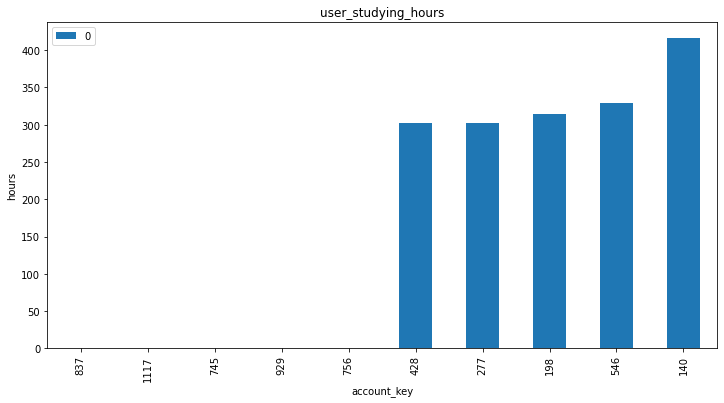

               0
837     0.000000
1117    0.000000
745     0.000000
929     0.000000
756     0.000000
428   302.240125
277   302.869608
198   313.722093
546   329.395111
140   416.522858


In [1523]:
plotDict(total_study_minutes_per_user, 5, 'account_key', "hours", "user_studying_hours")

In [1524]:
total_study_minutes_per_course = stats_study(data, 'course_title', 'total_minutes_visited', "Total study hour per each student")

9
Total study hour per each student: 54047.517509152225 hour


In [1525]:
total_study_minutes_per_course

{'Intro to Data Science': 20605.002014807724,
 'Intro to Machine Learning': 6091.752816405661,
 'Data Analysis with R': 6953.553592002642,
 'Data Visualization and D3.js': 1796.9486961333712,
 'JavaScript Basics': 258.1663076249884,
 'Data Wrangling with MongoDB': 14864.731985163948,
 'Intro to HTML and CSS': 343.51694648333955,
 'Data Analyst Nanodegree': 2663.789592283335,
 'A/B Testing': 470.05555824721944}

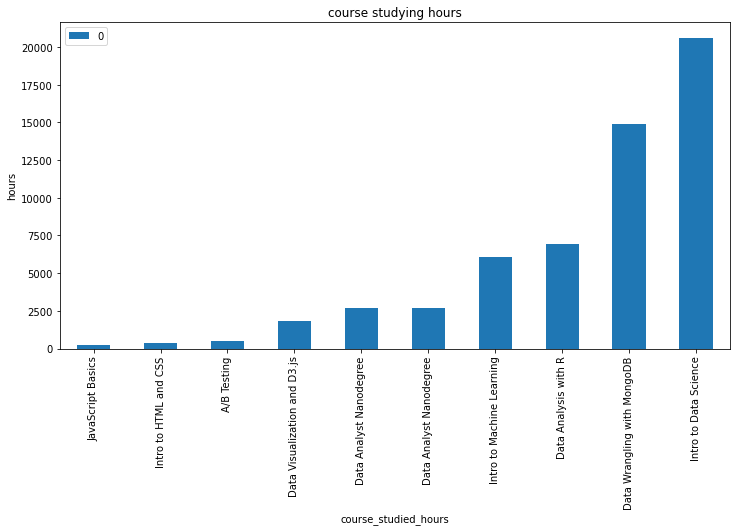

                                         0
JavaScript Basics               258.166308
Intro to HTML and CSS           343.516946
A/B Testing                     470.055558
Data Visualization and D3.js   1796.948696
Data Analyst Nanodegree        2663.789592
Data Analyst Nanodegree        2663.789592
Intro to Machine Learning      6091.752816
Data Analysis with R           6953.553592
Data Wrangling with MongoDB   14864.731985
Intro to Data Science         20605.002015


In [1526]:
plotDict(total_study_minutes_per_course, 5, 'course_studied_hours', "hours", "course studying hours")

###### Out of abut 55024 hours of studing for all courses there's a 976.86 hours are spent for: 'ud134a-nd' (21.46) and 'ud134-nd' (955.4), their percentage from the total number of hours =  1.77% ,actually it seems that there's an error while inserting courses values to the column as those values are tipical to that of 'sibling_key' patterns and that an output for each 'course_title' corresponding to its 'course_key' before removing 'course_key' column: 'A/B Testing': {'ud257-nd', 'ud257'}, 'ud134-nd': {'ud134-nd'}, 'ud134a-nd': {'ud134a-nd'}, for me it seems that the both values 'ud134a-nd' and 'ud134-nd' represents the same course as the output shows above, so as it don't know what's the course or the category of knowledge it represents and also it has a small percentage in the studied hours so I'm going to drop them out from the dataframe

In [1527]:
unknown_courses_df

,utc_date,account_key,registration_date,subscription_start,course_title,total_minutes_visited,lessons_completed,projects_completed
3811,2015-07-04,448,2014-08-05,2015-03-10,ud134-nd,0.000000,0.0,0.0
3822,2015-07-05,448,2014-08-05,2015-03-10,ud134-nd,0.000000,0.0,0.0
3845,2015-07-06,448,2014-08-05,2015-03-10,ud134-nd,0.000000,0.0,0.0
3864,2015-07-07,448,2014-08-05,2015-03-10,ud134-nd,0.000000,0.0,0.0
3881,2015-07-08,448,2014-08-05,2015-03-10,ud134-nd,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...
2309192,2015-08-24,854,2012-10-12,2015-08-23,ud134a-nd,0.000000,0.0,0.0
2309206,2015-08-25,854,2012-10-12,2015-08-23,ud134-nd,0.000000,0.0,0.0
2309207,2015-08-25,854,2012-10-12,2015-08-23,ud134a-nd,0.000000,0.0,0.0
2309226,2015-08-26,854,2012-10-12,2015-08-23,ud134-nd,0.000000,0.0,0.0


##### unknown_courses_df (52965) percentage represents 2.32% from the whole data (2275075)

In [1528]:
unknown_courses = ['ud134a-nd', 'ud134-nd']
unknown_courses_df = data.loc[data['course_title'].isin(unknown_courses)]

In [1529]:
data.drop(unknown_courses_df.index, inplace=True)

In [1530]:
data

,utc_date,account_key,registration_date,subscription_start,course_title,total_minutes_visited,lessons_completed,projects_completed
0,2014-11-05,448,2014-08-05,2014-11-05,Intro to Data Science,0.0,0.0,0.0
1,2014-11-05,448,2014-08-05,2014-11-05,Intro to Machine Learning,0.0,0.0,0.0
2,2014-11-05,448,2014-08-05,2014-11-05,Data Analysis with R,0.0,0.0,0.0
3,2014-11-05,448,2014-08-05,2014-11-05,Data Visualization and D3.js,0.0,0.0,0.0
4,2014-11-05,448,2014-08-05,2014-11-05,Data Analysis with R,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...
2309234,2015-08-26,854,2012-10-12,2015-08-23,Intro to Data Science,0.0,0.0,0.0
2309235,2015-08-26,854,2012-10-12,2015-08-23,JavaScript Basics,0.0,0.0,0.0
2309236,2015-08-26,854,2012-10-12,2015-08-23,Data Analysis with R,0.0,0.0,0.0
2309237,2015-08-26,854,2012-10-12,2015-08-23,Intro to HTML and CSS,0.0,0.0,0.0


In [1544]:
# calculates the sum per any column that the user wants to sum
def stats_study_1(df, col1, col2, title):
    counter = {}   
    total = 0
    for c_key in df[col1].unique():
        cnt=0
        for v in df[col2][df[col1]==c_key]:
            cnt+=v
        total+=cnt
        counter[c_key] = cnt
    
    print(len(counter))
    print(f"{title}: {total}")
    return counter

In [1545]:
total_study_lessons_per_course = stats_study_1(data, 'course_title', 'lessons_completed', "Total study hour per each student")

9
Total study hour per each student: 16558.0


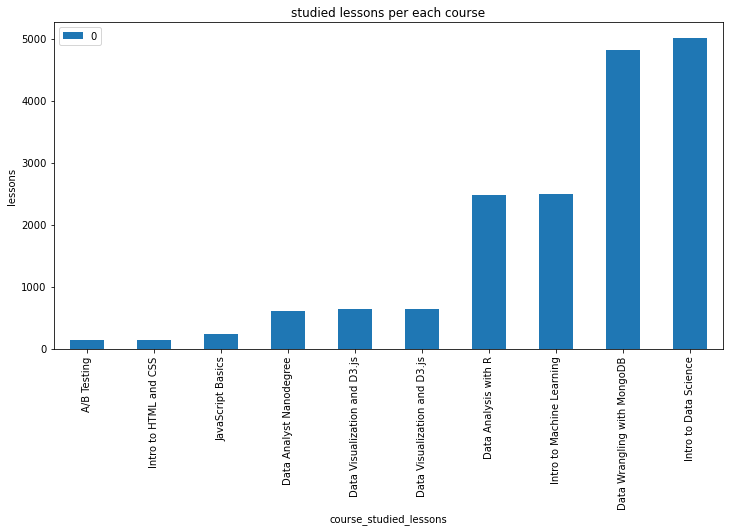

                                   0
A/B Testing                    133.0
Intro to HTML and CSS          143.0
JavaScript Basics              233.0
Data Analyst Nanodegree        604.0
Data Visualization and D3.js   645.0
Data Visualization and D3.js   645.0
Data Analysis with R          2474.0
Intro to Machine Learning     2499.0
Data Wrangling with MongoDB   4817.0
Intro to Data Science         5010.0


In [1546]:
plotDict(total_study_lessons_per_course, 5, 'course_studied_lessons', "lessons", "studied lessons per each course")

In [1547]:
total_done_projects_per_course = stats_study_1(data, 'course_title', 'projects_completed', "Total done projects per each student")

9
Total done projects per each student: 917.0


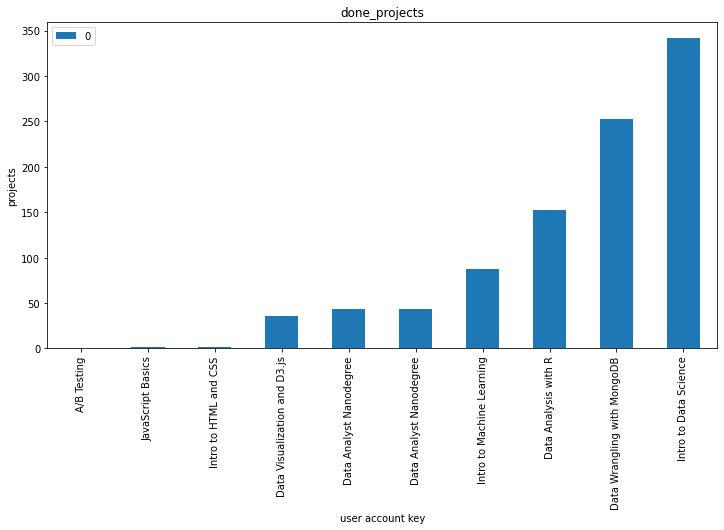

                                  0
A/B Testing                     0.0
JavaScript Basics               2.0
Intro to HTML and CSS           2.0
Data Visualization and D3.js   36.0
Data Analyst Nanodegree        43.0
Data Analyst Nanodegree        43.0
Intro to Machine Learning      87.0
Data Analysis with R          152.0
Data Wrangling with MongoDB   253.0
Intro to Data Science         342.0


In [1548]:
plotDict(total_done_projects_per_course, 5, "user account key", "projects", 'done_projects')

### In terms of the top most important topics we can take the most common four nanodegrees as follows:
- Intro to Data Science
- Data Wrangling with MongoDB
- Data Analysis with R / Intro to Machine Learning
#### so udacity can make more offers for those topics of study to meet user interests, also can create a new nanodegree which may contain about three projects each one covers one of those topics which may be preferred by alot of users

In [1549]:
total_study_lessons_per_user = stats_study_1(data, 'account_key', 'lessons_completed', "Total study hour per each student")

1237
Total study hour per each student: 16558.0


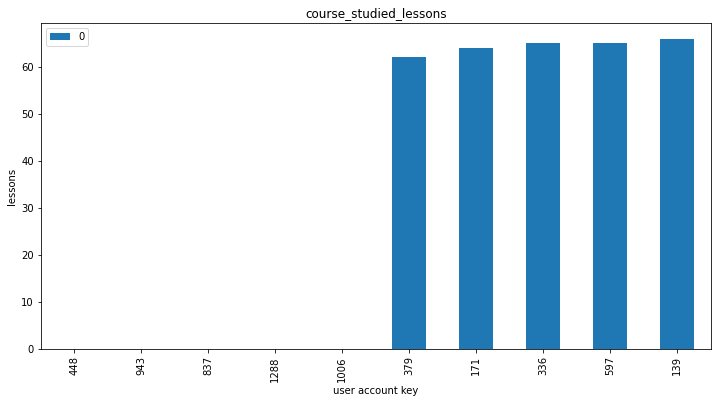

         0
448    0.0
943    0.0
837    0.0
1288   0.0
1006   0.0
379   62.0
171   64.0
336   65.0
597   65.0
139   66.0


In [1550]:
plotDict(total_study_lessons_per_user, 5, "user account key", "lessons", 'course_studied_lessons')

In [1551]:
total_study_projects_per_user = stats_study_1(data, 'account_key', 'projects_completed', "Total study hour per each student")

1237
Total study hour per each student: 917.0


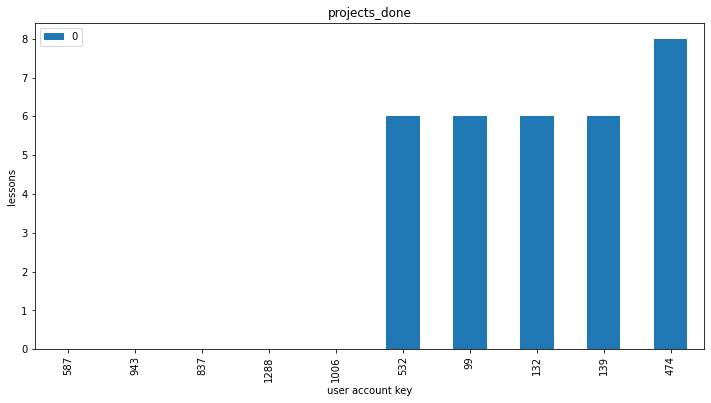

        0
587   0.0
943   0.0
837   0.0
1288  0.0
1006  0.0
532   6.0
99    6.0
132   6.0
139   6.0
474   8.0


In [1552]:
plotDict(total_study_projects_per_user, 5, "user account key", "lessons", 'projects_done')

In [1553]:
print(data['course_title'].unique())
print(len(data['course_title'].unique()))

['Intro to Data Science' 'Intro to Machine Learning'
 'Data Analysis with R' 'Data Visualization and D3.js' 'JavaScript Basics'
 'Data Wrangling with MongoDB' 'Intro to HTML and CSS'
 'Data Analyst Nanodegree' 'A/B Testing']
9


In [1554]:
help(stats)

Help on function stats in module __main__:

stats(df, col1, col2, threshold, title)



In [1555]:
stats(data, 'course_title', 'lessons_completed', 1, "course per number of completed lessons")

9
course per number of completed lessons: 12870


{'Intro to Data Science': 3988,
 'Intro to Machine Learning': 1759,
 'Data Analysis with R': 2002,
 'Data Visualization and D3.js': 468,
 'JavaScript Basics': 109,
 'Data Wrangling with MongoDB': 3761,
 'Intro to HTML and CSS': 108,
 'Data Analyst Nanodegree': 595,
 'A/B Testing': 80}

In [1556]:
stats(data, 'course_title', 'projects_completed', 1, "course per number of completed projects")

9
course per number of completed projects: 917


{'Intro to Data Science': 342,
 'Intro to Machine Learning': 87,
 'Data Analysis with R': 152,
 'Data Visualization and D3.js': 36,
 'JavaScript Basics': 2,
 'Data Wrangling with MongoDB': 253,
 'Intro to HTML and CSS': 2,
 'Data Analyst Nanodegree': 43,
 'A/B Testing': 0}

#### Now let's see what's the most year that the user's achieved in their courses

In [1559]:
pd.DatetimeIndex(data['subscription_start']).year.unique()

Int64Index([2014, 2015], dtype='int64', name='subscription_start')

In [1562]:
pd.DatetimeIndex(data['utc_date']).year.unique()

Int64Index([2014, 2015], dtype='int64', name='utc_date')

In [1564]:
pd.DatetimeIndex(data['registration_date']).year.unique()

Int64Index([2014, 2013, 2012, 2015, 1816], dtype='int64', name='registration_date')

In [1568]:
data['registration_date'][pd.DatetimeIndex(data['registration_date']).year==1816].count()

34

In [1569]:
year_1816 = data[pd.DatetimeIndex(data['registration_date']).year==1816]

In [1570]:
year_1816

,utc_date,account_key,registration_date,subscription_start,course_title,total_minutes_visited,lessons_completed,projects_completed
2308289,2015-08-23,880,1816-03-30,2015-08-23,Intro to Machine Learning,0.000000,0.0,0.0
2308290,2015-08-23,880,1816-03-30,2015-08-23,Data Visualization and D3.js,0.000000,0.0,0.0
2308291,2015-08-23,880,1816-03-30,2015-08-23,Data Wrangling with MongoDB,0.000000,0.0,0.0
2308292,2015-08-23,880,1816-03-30,2015-08-23,Intro to HTML and CSS,0.000000,0.0,0.0
2308293,2015-08-23,880,1816-03-30,2015-08-23,JavaScript Basics,0.000000,0.0,0.0
2308294,2015-08-23,880,1816-03-30,2015-08-23,Intro to Data Science,15.593026,0.0,0.0
2308295,2015-08-23,880,1816-03-30,2015-08-23,Data Analysis with R,0.000000,0.0,0.0
2308296,2015-08-23,880,1816-03-30,2015-08-23,A/B Testing,0.000000,0.0,0.0
2308297,2015-08-23,880,1816-03-30,2015-08-23,Intro to Machine Learning,0.000000,0.0,0.0
2308298,2015-08-23,880,1816-03-30,2015-08-23,A/B Testing,0.000000,0.0,0.0


##### Actually for 'registration_date' whrn year was 1816 there wasn't any technology yet, bad input so I'm going to drop it

In [1571]:
data.drop(year_1816.index, inplace=True)

In [1572]:
data

,utc_date,account_key,registration_date,subscription_start,course_title,total_minutes_visited,lessons_completed,projects_completed
0,2014-11-05,448,2014-08-05,2014-11-05,Intro to Data Science,0.0,0.0,0.0
1,2014-11-05,448,2014-08-05,2014-11-05,Intro to Machine Learning,0.0,0.0,0.0
2,2014-11-05,448,2014-08-05,2014-11-05,Data Analysis with R,0.0,0.0,0.0
3,2014-11-05,448,2014-08-05,2014-11-05,Data Visualization and D3.js,0.0,0.0,0.0
4,2014-11-05,448,2014-08-05,2014-11-05,Data Analysis with R,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...
2309234,2015-08-26,854,2012-10-12,2015-08-23,Intro to Data Science,0.0,0.0,0.0
2309235,2015-08-26,854,2012-10-12,2015-08-23,JavaScript Basics,0.0,0.0,0.0
2309236,2015-08-26,854,2012-10-12,2015-08-23,Data Analysis with R,0.0,0.0,0.0
2309237,2015-08-26,854,2012-10-12,2015-08-23,Intro to HTML and CSS,0.0,0.0,0.0


In [1573]:
pd.DatetimeIndex(data['registration_date']).year.unique()

Int64Index([2014, 2013, 2012, 2015], dtype='int64', name='registration_date')

In [1574]:
data['registration_date'][0].year

2014

In [1575]:
data['total_minutes_visited'][pd.DatetimeIndex(data['subscription_start']).year==2014].sum()

1273562.286094507

In [1576]:
data['total_minutes_visited'][pd.DatetimeIndex(data['subscription_start']).year==2015].sum()

1969273.1714284602

In [1577]:
data['total_minutes_visited'].sum()

3242835.457522968

##### Get common users for both subscription years: 2014, 2015
##### Also get the users that are related to each year

In [1578]:
acct_2014 = data['account_key'][pd.DatetimeIndex(data['subscription_start']).year==2014].unique()

In [1579]:
len(acct_2014)

429

In [1580]:
acct_2015 = data['account_key'][pd.DatetimeIndex(data['subscription_start']).year==2015].unique()

In [1581]:
len(acct_2015)

945

In [1582]:
len(data['account_key'].unique())

1237

In [1583]:
len(acct_2014) + len(acct_2015) == len(data['account_key'].unique())

False

In [1584]:
common_students = [x for x in acct_2014 if x in acct_2015]

In [1585]:
len(common_students)

137

In [1586]:
users_2014_only = [x for x in acct_2014 if x not in common_students]

In [1587]:
len(acct_2014_only)

292

In [1588]:
users_2015_only = [x for x in acct_2015 if x not in common_students]

In [1589]:
len(users_2015_only)

808

In [1590]:
len(common_students) + len(acct_2014_only) + len(users_2015_only) == len(data['account_key'].unique())

True

#### So now there's a three categories of students that can extract data according to

#### Some students doesn't achieve anything in the columns of 'total_minutes_visited',	'lessons_completed',	'projects_completed'
#### let's check which year have the highest number of inactive students

In [1595]:
lazy_acct_2014 = data['account_key'][(pd.DatetimeIndex(data['subscription_start']).year==2014) & (data['total_minutes_visited']==0) & (data['lessons_completed']==0) & (data['projects_completed']==0)].unique()

In [1596]:
len(lazy_acct_2014)

429

In [1597]:
lazy_acct_2015 = data['account_key'][(pd.DatetimeIndex(data['subscription_start']).year==2015) & (data['total_minutes_visited']==0) & (data['lessons_completed']==0) & (data['projects_completed']==0)].unique()

In [1598]:
len(lazy_acct_2015)

945

In [1599]:
list(lazy_acct_2014) == list(acct_2014)

True

In [1600]:
list(lazy_acct_2015) == list(acct_2015)

True

#### all the students are unstable for their nanodegrees material studying so we can neglect those data from the dataframe as it's huge and doesn't add any more information than that

In [1603]:
neglect = data.loc[(data['total_minutes_visited']==0) & (data['lessons_completed']==0) & (data['projects_completed']==0)]

In [1604]:
neglect

,utc_date,account_key,registration_date,subscription_start,course_title,total_minutes_visited,lessons_completed,projects_completed
0,2014-11-05,448,2014-08-05,2014-11-05,Intro to Data Science,0.0,0.0,0.0
1,2014-11-05,448,2014-08-05,2014-11-05,Intro to Machine Learning,0.0,0.0,0.0
2,2014-11-05,448,2014-08-05,2014-11-05,Data Analysis with R,0.0,0.0,0.0
3,2014-11-05,448,2014-08-05,2014-11-05,Data Visualization and D3.js,0.0,0.0,0.0
4,2014-11-05,448,2014-08-05,2014-11-05,Data Analysis with R,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...
2309234,2015-08-26,854,2012-10-12,2015-08-23,Intro to Data Science,0.0,0.0,0.0
2309235,2015-08-26,854,2012-10-12,2015-08-23,JavaScript Basics,0.0,0.0,0.0
2309236,2015-08-26,854,2012-10-12,2015-08-23,Data Analysis with R,0.0,0.0,0.0
2309237,2015-08-26,854,2012-10-12,2015-08-23,Intro to HTML and CSS,0.0,0.0,0.0


In [1605]:
data.drop(neglect.index, inplace=True)

In [1614]:
data

,utc_date,account_key,registration_date,subscription_start,course_title,total_minutes_visited,lessons_completed,projects_completed
75,2014-11-10,448,2014-08-05,2014-11-10,Intro to Data Science,4.201422,0.0,0.0
80,2014-11-10,448,2014-08-05,2014-11-10,Intro to HTML and CSS,21.863585,0.0,0.0
89,2014-11-10,448,2014-08-05,2014-11-10,Data Analyst Nanodegree,4.681858,0.0,0.0
129,2014-11-13,448,2014-08-05,2014-11-10,Intro to Data Science,14.644702,0.0,0.0
132,2014-11-13,448,2014-08-05,2014-11-10,Data Visualization and D3.js,4.972973,0.0,0.0
...,...,...,...,...,...,...,...,...
2309085,2015-08-23,754,2015-01-22,2015-08-21,Intro to Machine Learning,23.399109,0.0,0.0
2309124,2015-08-25,754,2015-01-22,2015-08-21,Intro to Machine Learning,40.125426,0.0,0.0
2309142,2015-08-26,754,2015-01-22,2015-08-21,Intro to Machine Learning,68.243253,0.0,0.0
2309162,2015-08-27,754,2015-01-22,2015-08-21,Intro to Machine Learning,281.558425,2.0,0.0


In [1615]:
pd.DatetimeIndex(data['subscription_start']).year.unique()

Int64Index([2014, 2015], dtype='int64', name='subscription_start')

In [1616]:
len(data['account_key'].unique())

1164

#### let's get students who subscribes in nanodegrees and not do any progress in it

In [1617]:
all_students = common_students + users_2014_only + users_2015_only

In [1618]:
good_students = list(data['account_key'].unique())

In [1619]:
bad_students = [u for u in all_students if u not in good_students]

In [1620]:
len(bad_students)

73

In [1613]:
bad_students

[837,
 1117,
 745,
 929,
 756,
 1114,
 930,
 683,
 1230,
 1239,
 1166,
 1203,
 865,
 767,
 1293,
 1234,
 907,
 790,
 867,
 1212,
 1074,
 1195,
 1092,
 1035,
 999,
 716,
 1045,
 1100,
 809,
 1066,
 899,
 1267,
 1088,
 729,
 1038,
 796,
 936,
 1265,
 1115,
 863,
 201,
 797,
 939,
 1275,
 1059,
 1192,
 1184,
 731,
 826,
 1266,
 1227,
 1172,
 978,
 951,
 915,
 1178,
 773,
 849,
 856,
 1302,
 879,
 1018,
 998,
 1136,
 816,
 840,
 1228,
 893,
 1028,
 1144,
 880,
 1157,
 874]

#### They are the 'account_key' for the users that didn't study anything or do any projects for any of the nanodegrees 

In [1621]:
data['subscription_start'][pd.DatetimeIndex(data['subscription_start']).year==2015].count()

27866

In [1622]:
# ['subscription_start', 'account_key', 'course_title', 'total_minutes_visited', 'lessons_completed', 'projects_completed']

In [1623]:
# to get the time spent per user for each of the courses across each year
def users_metadata(df, cols):
    total_yrs = {}
    lst_of_all_cols = []    # will be used in extraction of values from the df using regex
    
    for yr in pd.DatetimeIndex(df[cols[0]]).year.unique():
        total_all = {}
        print(f"\nfor year {yr}:")
        for acct in df[cols[1]].unique():
            courses_hrs = {}
            courses_lesn = {}
            courses_proj = {}
            total_hrs = 0
            for course in df[cols[2]].unique():
                c_hrs = course+'_hrs'
                c_lsns = course+'_lesson'
                c_proj = course+'_proj'
                
                mins = df[cols[3]][(pd.DatetimeIndex(df[cols[0]]).year==yr) & (df[cols[1]]==acct) & (df[cols[2]]==course)].sum()
                lessons = df[cols[4]][(pd.DatetimeIndex(df[cols[0]]).year==yr) & (df[cols[1]]==acct) & (df[cols[2]]==course)].sum()
                projects = df[cols[5]][(pd.DatetimeIndex(df[cols[0]]).year==yr) & (df[cols[1]]==acct) & (df[cols[2]]==course)].sum()
                courses_hrs[c_hrs] = mins/60
                courses_lesn[c_lsns] = lessons
                courses_proj[c_proj] = projects
                total_hrs += mins/60
        
            total_all[acct] = {cols[1]:acct, cols[0]:yr, "total_study_hrs":total_hrs, cols[4]:lessons, cols[5]:projects, 'c_hrs':courses_hrs, 'c_lsns':courses_lesn, 'c_proj':courses_proj}
            #print(total_all[acct])
            print(f"\tuser {acct} done...")
        total_yrs[yr] = total_all
    
    lst_of_all_cols.extend((cols[1], cols[0], "total_study_hrs", cols[4], cols[5]))
    lst_of_cols = [va for va in list(courses_hrs) + list(courses_lesn) + list(courses_proj)]
    lst_of_all_cols = lst_of_all_cols + lst_of_cols
        
    return total_yrs, lst_of_all_cols

In [1624]:
metadata, meta_cols = users_metadata(data, ['subscription_start', 'account_key', 'course_title', 'total_minutes_visited', 'lessons_completed', 'projects_completed'])


for year 2014:
	user 448 done...
	user 44 done...
	user 258 done...
	user 366 done...
	user 587 done...
	user 943 done...
	user 412 done...
	user 1288 done...
	user 1006 done...
	user 429 done...
	user 130 done...
	user 31 done...
	user 919 done...
	user 204 done...
	user 439 done...
	user 72 done...
	user 580 done...
	user 225 done...
	user 179 done...
	user 224 done...
	user 553 done...
	user 1094 done...
	user 649 done...
	user 655 done...
	user 336 done...
	user 150 done...
	user 408 done...
	user 458 done...
	user 494 done...
	user 369 done...
	user 913 done...
	user 601 done...
	user 506 done...
	user 156 done...
	user 963 done...
	user 522 done...
	user 595 done...
	user 480 done...
	user 544 done...
	user 378 done...
	user 810 done...
	user 81 done...
	user 483 done...
	user 1174 done...
	user 512 done...
	user 604 done...
	user 568 done...
	user 700 done...
	user 91 done...
	user 268 done...
	user 550 done...
	user 1300 done...
	user 90 done...
	user 584 done...
	user 431 don

In [1625]:
len(metadata)

2

In [1626]:
len(meta_cols)

32

In [1627]:
meta_cols

['account_key',
 'subscription_start',
 'total_study_hrs',
 'lessons_completed',
 'projects_completed',
 'Intro to Data Science_hrs',
 'Intro to HTML and CSS_hrs',
 'Data Analyst Nanodegree_hrs',
 'Data Visualization and D3.js_hrs',
 'Data Analysis with R_hrs',
 'JavaScript Basics_hrs',
 'Intro to Machine Learning_hrs',
 'A/B Testing_hrs',
 'Data Wrangling with MongoDB_hrs',
 'Intro to Data Science_lesson',
 'Intro to HTML and CSS_lesson',
 'Data Analyst Nanodegree_lesson',
 'Data Visualization and D3.js_lesson',
 'Data Analysis with R_lesson',
 'JavaScript Basics_lesson',
 'Intro to Machine Learning_lesson',
 'A/B Testing_lesson',
 'Data Wrangling with MongoDB_lesson',
 'Intro to Data Science_proj',
 'Intro to HTML and CSS_proj',
 'Data Analyst Nanodegree_proj',
 'Data Visualization and D3.js_proj',
 'Data Analysis with R_proj',
 'JavaScript Basics_proj',
 'Intro to Machine Learning_proj',
 'A/B Testing_proj',
 'Data Wrangling with MongoDB_proj']

In [1628]:
metadata

{2014: {448: {'account_key': 448,
   'subscription_start': 2014,
   'total_study_hrs': 7.8653575361103325,
   'lessons_completed': 0.0,
   'projects_completed': 0.0,
   'c_hrs': {'Intro to Data Science_hrs': 1.6309671222228335,
    'Intro to HTML and CSS_hrs': 0.764402430555,
    'Data Analyst Nanodegree_hrs': 3.4060649444443327,
    'Data Visualization and D3.js_hrs': 0.15292225277766666,
    'Data Analysis with R_hrs': 0.35808756388833335,
    'JavaScript Basics_hrs': 0.9720301583333334,
    'Intro to Machine Learning_hrs': 0.5808830638888334,
    'A/B Testing_hrs': 0.0,
    'Data Wrangling with MongoDB_hrs': 0.0},
   'c_lsns': {'Intro to Data Science_lesson': 0.0,
    'Intro to HTML and CSS_lesson': 0.0,
    'Data Analyst Nanodegree_lesson': 0.0,
    'Data Visualization and D3.js_lesson': 0.0,
    'Data Analysis with R_lesson': 0.0,
    'JavaScript Basics_lesson': 0.0,
    'Intro to Machine Learning_lesson': 0.0,
    'A/B Testing_lesson': 0.0,
    'Data Wrangling with MongoDB_lesson

In [1634]:
metadata[2014][160]['c_proj']

{'Intro to Data Science_proj': 1.0,
 'Intro to HTML and CSS_proj': 0.0,
 'Data Analyst Nanodegree_proj': 0.0,
 'Data Visualization and D3.js_proj': 0.0,
 'Data Analysis with R_proj': 0.0,
 'JavaScript Basics_proj': 0.0,
 'Intro to Machine Learning_proj': 0.0,
 'A/B Testing_proj': 0.0,
 'Data Wrangling with MongoDB_proj': 0.0}

In [1635]:
metadata[2014][50]['c_proj'] == metadata[2015][50]['c_proj']

False

In [1636]:
metadata[2014][50] == metadata[2015][50]

False

In [1637]:
users_study_df = pd.DataFrame.from_dict(metadata, orient='index').T

In [1638]:
users_study_df

,2014,2015
448,"{'account_key': 448, 'subscription_start': 201...","{'account_key': 448, 'subscription_start': 201..."
44,"{'account_key': 44, 'subscription_start': 2014...","{'account_key': 44, 'subscription_start': 2015..."
258,"{'account_key': 258, 'subscription_start': 201...","{'account_key': 258, 'subscription_start': 201..."
366,"{'account_key': 366, 'subscription_start': 201...","{'account_key': 366, 'subscription_start': 201..."
587,"{'account_key': 587, 'subscription_start': 201...","{'account_key': 587, 'subscription_start': 201..."
...,...,...
990,"{'account_key': 990, 'subscription_start': 201...","{'account_key': 990, 'subscription_start': 201..."
686,"{'account_key': 686, 'subscription_start': 201...","{'account_key': 686, 'subscription_start': 201..."
1067,"{'account_key': 1067, 'subscription_start': 20...","{'account_key': 1067, 'subscription_start': 20..."
754,"{'account_key': 754, 'subscription_start': 201...","{'account_key': 754, 'subscription_start': 201..."


In [1639]:
users_study_df.to_csv('cleaned_daily_engagement.csv')

In [1640]:
users_study_df.columns

Int64Index([2014, 2015], dtype='int64')

In [1641]:
users_study_df[2014][130]

{'account_key': 130,
 'subscription_start': 2014,
 'total_study_hrs': 86.96879140835233,
 'lessons_completed': 8.0,
 'projects_completed': 0.0,
 'c_hrs': {'Intro to Data Science_hrs': 53.17091580556167,
  'Intro to HTML and CSS_hrs': 0.0,
  'Data Analyst Nanodegree_hrs': 3.4385773888845006,
  'Data Visualization and D3.js_hrs': 0.0,
  'Data Analysis with R_hrs': 0.0,
  'JavaScript Basics_hrs': 0.0,
  'Intro to Machine Learning_hrs': 0.0,
  'A/B Testing_hrs': 0.0,
  'Data Wrangling with MongoDB_hrs': 30.359298213906165},
 'c_lsns': {'Intro to Data Science_lesson': 9.0,
  'Intro to HTML and CSS_lesson': 0.0,
  'Data Analyst Nanodegree_lesson': 0.0,
  'Data Visualization and D3.js_lesson': 0.0,
  'Data Analysis with R_lesson': 0.0,
  'JavaScript Basics_lesson': 0.0,
  'Intro to Machine Learning_lesson': 0.0,
  'A/B Testing_lesson': 0.0,
  'Data Wrangling with MongoDB_lesson': 8.0},
 'c_proj': {'Intro to Data Science_proj': 1.0,
  'Intro to HTML and CSS_proj': 0.0,
  'Data Analyst Nanodegr

In [1642]:
#users_study_df = users_study_df.astype(str)
users_study_df.dtypes

2014    object
2015    object
dtype: object

#### We can now use regular expression in python to extract the wanted data

In [1645]:
import re

In [1646]:
def regex_df(df, new_cols):
    lst_of_dfs = []
    
    for c in df.columns:
        df_lst = []
        #df_new = pd.DataFrame(columns=new_cols)
        
        for row in df[c]:
            spare = []
            
            for col in new_cols:
                to_extract = re.compile(f"'{col}': [0-9]+((.[0-9])?)*")   # (?s:.*?)   # .[0-9]?
                #to_extract = re.match(col, str(row))
                compared = to_extract.search(str(row))
                if compared!=None:
                    spare.append(str(compared.group()[len(col)+4:]))
                else:
                    spare.append(None)
            
            df_lst.append(spare)
        
        df_new = pd.DataFrame(df_lst, columns=new_cols)
        df_new.to_csv(f'daily_engagement_{c}.csv')
        print(f"daily_engagement_{c} has been saved....")
        lst_of_dfs.append(df_new)
    return lst_of_dfs

In [1647]:
each_year_user_lst_df = regex_df(users_study_df, meta_cols)

daily_engagement_2014 has been saved....
daily_engagement_2015 has been saved....


In [1648]:
each_year_user_lst_df

[     account_key subscription_start     total_study_hrs lessons_completed  \
 0            448               2014   7.865357536110332               0.0   
 1             44               2014  46.394156652769325              12.0   
 2            258               2014      99.50050039167              11.0   
 3            366               2014   102.5816878972188              11.0   
 4            587               2014  17.879348477769334               0.0   
 ...          ...                ...                 ...               ...   
 1159         990               2014                 0.0               0.0   
 1160         686               2014                 0.0               0.0   
 1161        1067               2014                 0.0               0.0   
 1162         754               2014                 0.0               0.0   
 1163         854               2014                 0.0               0.0   
 
      projects_completed Intro to Data Science_hrs Intro to HT

#### Now we have two .csv files contains the student progress per each year starting from the subscribtion date 

In [1649]:
len(acct_2014)

429

In [1650]:
len(acct_2015)

945

In [1651]:
len(common_students)

137

##### Actually there's a little problem, which is the csv files that are created for students contains all of them for both years, and that's not true, it's not a real problem as the data filled for those students that didn't achieve any progress during the year as zeros for all columns, but if we remove them we'll have a more cleaned data, so it's optional, and I'm going to remove it and save my data once again without any overwritting

In [1652]:
df_2014 = pd.read_csv("daily_engagement_2014.csv")

In [1653]:
df_2014

,Unnamed: 0,account_key,subscription_start,total_study_hrs,lessons_completed,projects_completed,Intro to Data Science_hrs,Intro to HTML and CSS_hrs,Data Analyst Nanodegree_hrs,Data Visualization and D3.js_hrs,...,Data Wrangling with MongoDB_lesson,Intro to Data Science_proj,Intro to HTML and CSS_proj,Data Analyst Nanodegree_proj,Data Visualization and D3.js_proj,Data Analysis with R_proj,JavaScript Basics_proj,Intro to Machine Learning_proj,A/B Testing_proj,Data Wrangling with MongoDB_proj
0,0,448,2014,7.865358,0.0,0.0,1.630967,0.764402,3.406065,0.152922,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,44,2014,46.394157,12.0,0.0,22.170880,0.000000,2.638167,0.000000,...,12.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,258,2014,99.500500,11.0,1.0,22.683016,0.000000,5.058335,9.445516,...,11.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0
3,3,366,2014,102.581688,11.0,0.0,33.869980,0.000000,2.968251,3.994800,...,11.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,587,2014,17.879348,0.0,0.0,16.004608,0.000000,1.617224,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1159,1159,990,2014,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1160,1160,686,2014,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1161,1161,1067,2014,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1162,1162,754,2014,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [1654]:
df_2015 = pd.read_csv("daily_engagement_2015.csv")

In [1655]:
df_2015

,Unnamed: 0,account_key,subscription_start,total_study_hrs,lessons_completed,projects_completed,Intro to Data Science_hrs,Intro to HTML and CSS_hrs,Data Analyst Nanodegree_hrs,Data Visualization and D3.js_hrs,...,Data Wrangling with MongoDB_lesson,Intro to Data Science_proj,Intro to HTML and CSS_proj,Data Analyst Nanodegree_proj,Data Visualization and D3.js_proj,Data Analysis with R_proj,JavaScript Basics_proj,Intro to Machine Learning_proj,A/B Testing_proj,Data Wrangling with MongoDB_proj
0,0,448,2015,13.087179,0.0,0.0,0.052843,0.332655,10.152174,1.096989,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,44,2015,24.786225,0.0,1.0,0.000000,0.000000,1.376196,0.045869,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
2,2,258,2015,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,3,366,2015,3.230153,0.0,0.0,1.925213,0.000000,0.305574,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,587,2015,41.099905,5.0,0.0,28.539121,0.000000,1.250587,0.000000,...,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1159,1159,990,2015,0.836528,0.0,0.0,0.000000,0.000000,0.836528,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1160,1160,686,2015,0.160202,0.0,0.0,0.000000,0.000000,0.160202,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1161,1161,1067,2015,0.495629,0.0,0.0,0.000000,0.000000,0.495629,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1162,1162,754,2015,6.888770,0.0,0.0,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [1656]:
df_2014['account_key'].tolist() == df_2015['account_key'].tolist()

True

In [1657]:
unwanted_for_2014 = [x for x in acct_2015 if x not in acct_2014]

In [1658]:
len(unwanted_for_2014)

808

In [1659]:
len(unwanted_for_2014) + len(common_students) == len(acct_2015)

True

In [1660]:
unwanted_for_2015 = [x for x in acct_2014 if x not in acct_2015]

In [1661]:
len(unwanted_for_2015)

292

In [1662]:
len(unwanted_for_2015) + len(common_students) == len(acct_2014)

True

In [1663]:
len(unwanted_for_2014) + len(common_students) == len(acct_2015)

True

In [1664]:
neglect_2014 = df_2014[df_2014['account_key'].isin(unwanted_for_2014)]

In [1665]:
neglect_2014

,Unnamed: 0,account_key,subscription_start,total_study_hrs,lessons_completed,projects_completed,Intro to Data Science_hrs,Intro to HTML and CSS_hrs,Data Analyst Nanodegree_hrs,Data Visualization and D3.js_hrs,...,Data Wrangling with MongoDB_lesson,Intro to Data Science_proj,Intro to HTML and CSS_proj,Data Analyst Nanodegree_proj,Data Visualization and D3.js_proj,Data Analysis with R_proj,JavaScript Basics_proj,Intro to Machine Learning_proj,A/B Testing_proj,Data Wrangling with MongoDB_proj
410,410,460,2014,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
411,411,108,2014,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
412,412,197,2014,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
413,413,442,2014,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
414,414,1283,2014,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1159,1159,990,2014,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1160,1160,686,2014,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1161,1161,1067,2014,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1162,1162,754,2014,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [1666]:
df_2014.drop(neglect_2014.index, inplace=True)

In [1667]:
df_2014

,Unnamed: 0,account_key,subscription_start,total_study_hrs,lessons_completed,projects_completed,Intro to Data Science_hrs,Intro to HTML and CSS_hrs,Data Analyst Nanodegree_hrs,Data Visualization and D3.js_hrs,...,Data Wrangling with MongoDB_lesson,Intro to Data Science_proj,Intro to HTML and CSS_proj,Data Analyst Nanodegree_proj,Data Visualization and D3.js_proj,Data Analysis with R_proj,JavaScript Basics_proj,Intro to Machine Learning_proj,A/B Testing_proj,Data Wrangling with MongoDB_proj
0,0,448,2014,7.865358,0.0,0.0,1.630967,0.764402,3.406065,0.152922,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,44,2014,46.394157,12.0,0.0,22.170880,0.000000,2.638167,0.000000,...,12.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,258,2014,99.500500,11.0,1.0,22.683016,0.000000,5.058335,9.445516,...,11.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0
3,3,366,2014,102.581688,11.0,0.0,33.869980,0.000000,2.968251,3.994800,...,11.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,587,2014,17.879348,0.0,0.0,16.004608,0.000000,1.617224,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
405,405,987,2014,1.060631,0.0,0.0,0.000000,0.000000,0.217330,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
406,406,917,2014,0.612932,0.0,0.0,0.506507,0.000000,0.106425,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
407,407,474,2014,74.349377,11.0,1.0,15.806123,2.393722,3.264829,7.740320,...,11.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0
408,408,634,2014,52.854911,11.0,1.0,20.995900,0.000000,1.178572,0.000000,...,11.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [1669]:
df_2014.to_csv("cleaned_2014.csv")

In [1670]:
neglect_2015 = df_2015[df_2015['account_key'].isin(unwanted_for_2015)]

In [1671]:
df_2015.drop(neglect_2015.index, inplace=True)

In [1672]:
df_2015

,Unnamed: 0,account_key,subscription_start,total_study_hrs,lessons_completed,projects_completed,Intro to Data Science_hrs,Intro to HTML and CSS_hrs,Data Analyst Nanodegree_hrs,Data Visualization and D3.js_hrs,...,Data Wrangling with MongoDB_lesson,Intro to Data Science_proj,Intro to HTML and CSS_proj,Data Analyst Nanodegree_proj,Data Visualization and D3.js_proj,Data Analysis with R_proj,JavaScript Basics_proj,Intro to Machine Learning_proj,A/B Testing_proj,Data Wrangling with MongoDB_proj
0,0,448,2015,13.087179,0.0,0.0,0.052843,0.332655,10.152174,1.096989,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,44,2015,24.786225,0.0,1.0,0.000000,0.000000,1.376196,0.045869,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
3,3,366,2015,3.230153,0.0,0.0,1.925213,0.000000,0.305574,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,587,2015,41.099905,5.0,0.0,28.539121,0.000000,1.250587,0.000000,...,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,6,412,2015,3.528850,0.0,0.0,0.137447,0.000000,0.407035,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1159,1159,990,2015,0.836528,0.0,0.0,0.000000,0.000000,0.836528,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1160,1160,686,2015,0.160202,0.0,0.0,0.000000,0.000000,0.160202,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1161,1161,1067,2015,0.495629,0.0,0.0,0.000000,0.000000,0.495629,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1162,1162,754,2015,6.888770,0.0,0.0,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [1673]:
df_2015.to_csv("cleaned_2015.csv")

#### Now let's plot some plots for the students according to their achievements in both years

In [1674]:
cleaned_2014 = pd.read_csv('cleaned_2014.csv')
cleaned_2015 = pd.read_csv('cleaned_2015.csv')

In [1675]:
len(cleaned_2015.columns)

34

In [1676]:
len(cleaned_2014.columns)

34

In [1678]:
to_plot_hrs = list(cleaned_2015.columns)[7:16]

In [1679]:
to_plot_hrs

['Intro to Data Science_hrs',
 'Intro to HTML and CSS_hrs',
 'Data Analyst Nanodegree_hrs',
 'Data Visualization and D3.js_hrs',
 'Data Analysis with R_hrs',
 'JavaScript Basics_hrs',
 'Intro to Machine Learning_hrs',
 'A/B Testing_hrs',
 'Data Wrangling with MongoDB_hrs']

In [1680]:
to_plot_lsns = list(cleaned_2015.columns)[16:25]

In [1681]:
to_plot_lsns

['Intro to Data Science_lesson',
 'Intro to HTML and CSS_lesson',
 'Data Analyst Nanodegree_lesson',
 'Data Visualization and D3.js_lesson',
 'Data Analysis with R_lesson',
 'JavaScript Basics_lesson',
 'Intro to Machine Learning_lesson',
 'A/B Testing_lesson',
 'Data Wrangling with MongoDB_lesson']

In [1682]:
to_plot_projs = list(cleaned_2015.columns)[25:]

In [1683]:
to_plot_projs

['Intro to Data Science_proj',
 'Intro to HTML and CSS_proj',
 'Data Analyst Nanodegree_proj',
 'Data Visualization and D3.js_proj',
 'Data Analysis with R_proj',
 'JavaScript Basics_proj',
 'Intro to Machine Learning_proj',
 'A/B Testing_proj',
 'Data Wrangling with MongoDB_proj']

plot the data according to the studied hours, completed_lessons and completed_projects per each nanodegree to get the most five students per each nanodegree

In [1699]:
def plot_progress(df, col1, cols_lst_hrs, cols_lst_lsns, cols_lst_proj, num):
    numbr = [i+1 for i in range(len(cols_lst_hrs))]
    for hrs, lsns, proj, n in zip(cols_lst_hrs, cols_lst_lsns, cols_lst_proj, numbr):
        fig, axes = plt.subplots(1, 3, figsize=(11, 5))
        title = hrs.split('_')[0]
        fig.suptitle(title, fontsize=16)
        
        df_hrs = df.sort_values(by=[hrs])
        df_lsns = df.sort_values(by=[lsns])
        df_proj = df.sort_values(by=[proj])
        
        toPlot_hrs = df_hrs[hrs].tail(num)
        toPlot_lsns = df_lsns[lsns].tail(num)
        toPlot_proj = df_proj[proj].tail(num)
        
        toPlot_hrs.plot(ax=axes[0], kind='bar', title=title, figsize=(10, 6))
        toPlot_lsns.plot(ax=axes[1], kind='bar', title=title, figsize=(10, 6))
        toPlot_proj.plot(ax=axes[2], kind='bar', title=title, figsize=(10, 6))
        
        axes[0].set_title(hrs.split('_')[1])
        axes[1].set_title(lsns.split('_')[1])
        axes[2].set_title(proj.split('_')[1])
        plt.savefig(f'{n}.png', facecolor='w', bbox_inches="tight", pad_inches=0.3, transparent=False)
        plt.show()
        #plt.xlabel(col1)
        #plt.ylabel(col2)
        #plt.show()
        print(toPlot_hrs, toPlot_lsns, toPlot_proj)

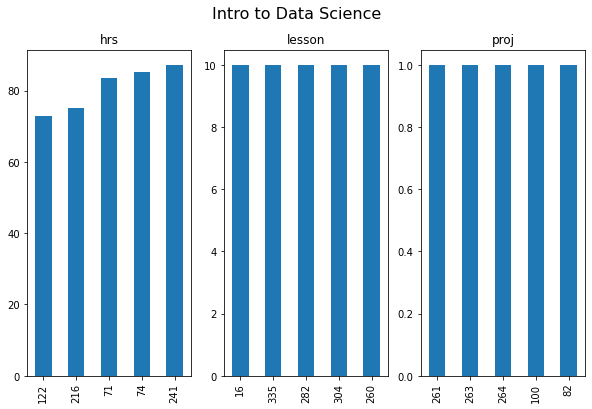

122    72.939193
216    75.020808
71     83.520889
74     85.327424
241    87.144486
Name: Intro to Data Science_hrs, dtype: float64 16     10.0
335    10.0
282    10.0
304    10.0
260    10.0
Name: Intro to Data Science_lesson, dtype: float64 261    1.0
263    1.0
264    1.0
100    1.0
82     1.0
Name: Intro to Data Science_proj, dtype: float64


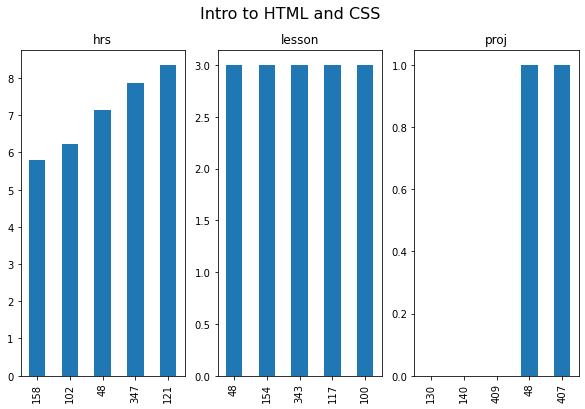

158    5.808720
102    6.232276
48     7.137908
347    7.861887
121    8.349262
Name: Intro to HTML and CSS_hrs, dtype: float64 48     3.0
154    3.0
343    3.0
117    3.0
100    3.0
Name: Intro to HTML and CSS_lesson, dtype: float64 130    0.0
140    0.0
409    0.0
48     1.0
407    1.0
Name: Intro to HTML and CSS_proj, dtype: float64


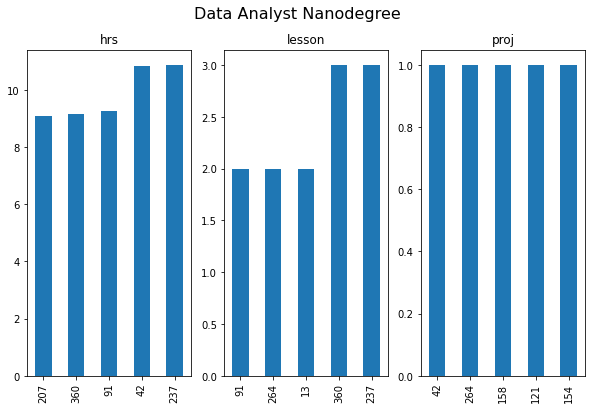

207     9.080338
360     9.154015
91      9.258947
42     10.848733
237    10.874616
Name: Data Analyst Nanodegree_hrs, dtype: float64 91     2.0
264    2.0
13     2.0
360    3.0
237    3.0
Name: Data Analyst Nanodegree_lesson, dtype: float64 42     1.0
264    1.0
158    1.0
121    1.0
154    1.0
Name: Data Analyst Nanodegree_proj, dtype: float64


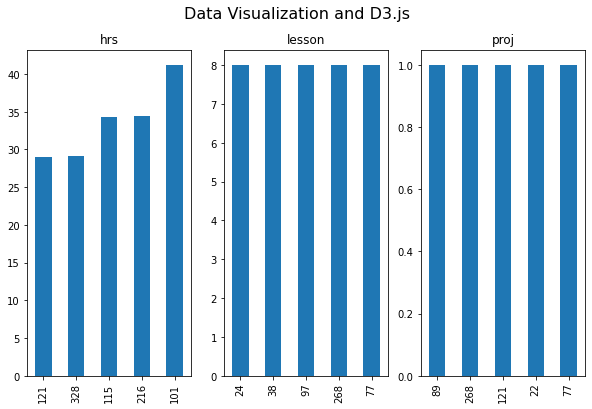

121    28.997682
328    29.093131
115    34.349993
216    34.425644
101    41.181727
Name: Data Visualization and D3.js_hrs, dtype: float64 24     8.0
38     8.0
97     8.0
268    8.0
77     8.0
Name: Data Visualization and D3.js_lesson, dtype: float64 89     1.0
268    1.0
121    1.0
22     1.0
77     1.0
Name: Data Visualization and D3.js_proj, dtype: float64


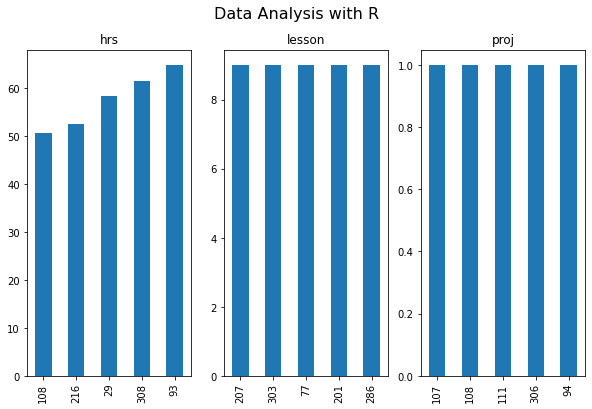

108    50.604694
216    52.406257
29     58.416228
308    61.452862
93     64.785145
Name: Data Analysis with R_hrs, dtype: float64 207    9.0
303    9.0
77     9.0
201    9.0
286    9.0
Name: Data Analysis with R_lesson, dtype: float64 107    1.0
108    1.0
111    1.0
306    1.0
94     1.0
Name: Data Analysis with R_proj, dtype: float64


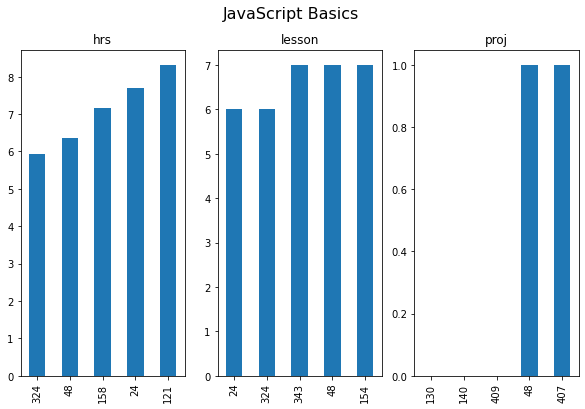

324    5.920621
48     6.367822
158    7.172721
24     7.707952
121    8.310206
Name: JavaScript Basics_hrs, dtype: float64 24     6.0
324    6.0
343    7.0
48     7.0
154    7.0
Name: JavaScript Basics_lesson, dtype: float64 130    0.0
140    0.0
409    0.0
48     1.0
407    1.0
Name: JavaScript Basics_proj, dtype: float64


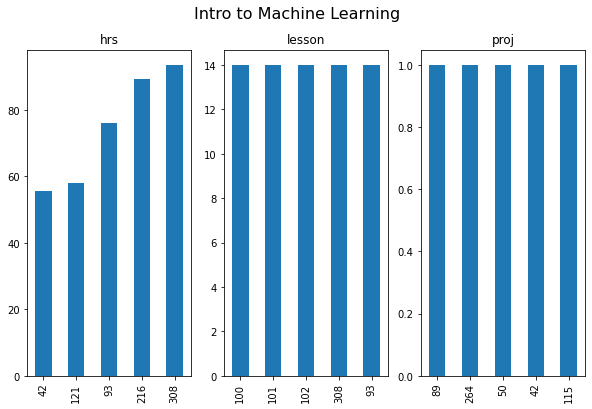

42     55.472784
121    57.905742
93     76.009287
216    89.215894
308    93.494506
Name: Intro to Machine Learning_hrs, dtype: float64 100    14.0
101    14.0
102    14.0
308    14.0
93     14.0
Name: Intro to Machine Learning_lesson, dtype: float64 89     1.0
264    1.0
50     1.0
42     1.0
115    1.0
Name: Intro to Machine Learning_proj, dtype: float64


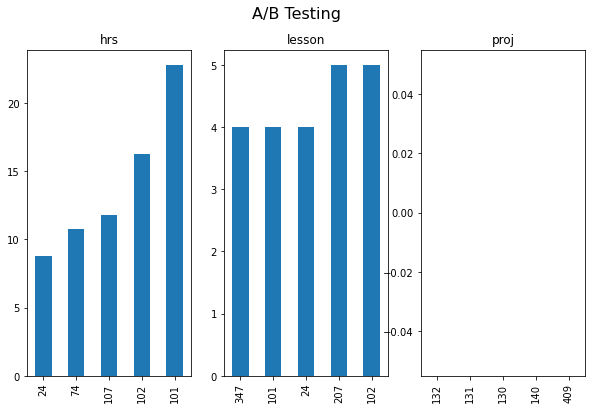

24      8.757659
74     10.734904
107    11.776014
102    16.290011
101    22.784276
Name: A/B Testing_hrs, dtype: float64 347    4.0
101    4.0
24     4.0
207    5.0
102    5.0
Name: A/B Testing_lesson, dtype: float64 132    0.0
131    0.0
130    0.0
140    0.0
409    0.0
Name: A/B Testing_proj, dtype: float64


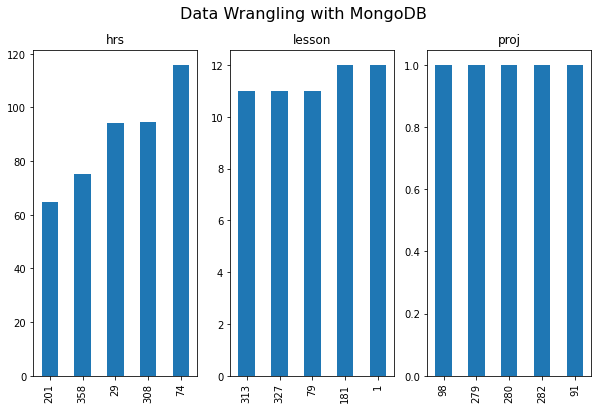

201     64.806271
358     75.069440
29      94.013464
308     94.702774
74     115.771617
Name: Data Wrangling with MongoDB_hrs, dtype: float64 313    11.0
327    11.0
79     11.0
181    12.0
1      12.0
Name: Data Wrangling with MongoDB_lesson, dtype: float64 98     1.0
279    1.0
280    1.0
282    1.0
91     1.0
Name: Data Wrangling with MongoDB_proj, dtype: float64


In [1700]:
plot_progress(cleaned_2014, 'account_key', to_plot_hrs, to_plot_lsns, to_plot_projs, 5)

we got the progress of the top students according to: the hours studied, the lessons completed, and the completed projects for 2014